### Ref

In [1]:
# https://yungyung7654321.medium.com/python%E5%AF%A6%E4%BD%9C%E8%87%AA%E5%8B%95%E5%85%A8%E6%99%AF%E5%9C%96%E6%8B%BC%E6%8E%A5-automatic-panoramic-image-stitching-28629c912b5a
# https://github.com/dastratakos/Homography-Estimation/blob/main/imageAnalysis.py
# https://zhuanlan.zhihu.com/p/34761031
# https://github.com/j40903272/VFX2018
# https://www.analyticsvidhya.com/blog/2021/06/feature-detection-description-and-matching-of-images-using-opencv/
# https://github.com/jnfem112/VFX2022SPRING
# https://www.geekering.com/programming-languages/python/brunorsilva/harris-corner-detector-python/
# https://github.com/shuoenchang/NTU-Digital_Visual_Effects-VFX
# https://github.com/qhan1028/Image-Stitching
# https://github.com/KenYu910645/VFX2022/tree/main/hw2_image_stiching

### Environment Setup

In [2]:
from pylab import *
import numpy as np
from scipy.ndimage.filters import maximum_filter
import scipy
from matplotlib import pyplot as plt
import cv2
import random
import os
import argparse
from time import time
%matplotlib inline

C:\Users\yuting\AppData\Local\Temp\ipykernel_14672\2251391679.py:3: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import maximum_filter


In [20]:
args = {
    'input_directory'  : '../data/input/1/' , 
    'scale'            : 0.8 ,  
    'focal_length'     : 2016 , 
    'output_image'     : '../result.jpg',
    'window'           : 16,
    'N'                : 2048,
    'descriptors_sift' : True,
    'R_window_scale'   : 2
}

args = argparse.Namespace(**args)

In [21]:
file_list = []
for f in os.listdir(args.input_directory):
    if ".JPG" in f or ".jpg" in f or ".png" in f or ".PNG" in f:
        file_list.append(args.input_directory+f)

file_list = list(file_list)
file_list.sort()
images = [cv2.imread(i) for i in file_list]
# resize for test
images = [cv2.resize(img , (int(args.scale * img.shape[1]) , int(args.scale * img.shape[0])) , cv2.INTER_LINEAR) for img in images]
print (file_list)

['../data/input/1/IMG_5933.JPG', '../data/input/1/IMG_5934.JPG', '../data/input/1/IMG_5936.JPG', '../data/input/1/IMG_5937.JPG', '../data/input/1/IMG_5938.JPG', '../data/input/1/IMG_5939.JPG', '../data/input/1/IMG_5940.JPG', '../data/input/1/IMG_5941.JPG', '../data/input/1/IMG_5942.JPG', '../data/input/1/IMG_5944.JPG', '../data/input/1/IMG_5945.JPG', '../data/input/1/IMG_5954.JPG']


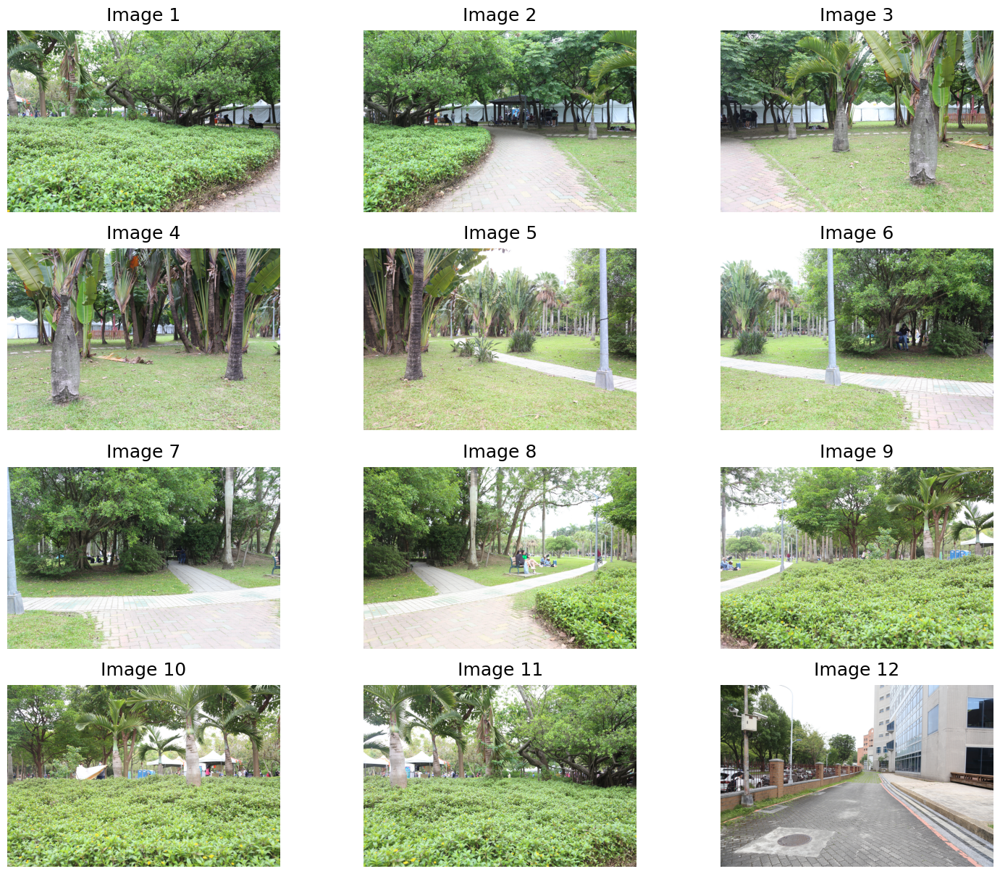

In [22]:
fig , axes = plt.subplots(int(np.ceil(len(images) / 3)) , 3, figsize = (18 , 15))
for i , image in enumerate(images):
    ax = axes[i // 3 , i % 3]
    ax.set_title(f'Image {i + 1}' , fontsize = 18 , y = 1.02)
    ax.imshow(cv2.cvtColor(image , cv2.COLOR_BGR2RGB))
    ax.set_axis_off()
plt.show()

In [23]:
def cylindrical_projection_new(images, focal_length):
    h, w, _ = images[0].shape
    img_cylinders = []
    masks = []
    border_list = []
    for i in range(len(images)):
        img_cylinder = np.zeros(shape=images[i].shape, dtype=np.uint8)

        # 建立原圖 x, y 座標矩陣
        ori_x, ori_y = np.meshgrid(np.arange(w), np.arange(h))

        # 轉換為極座標
        x = ori_x - w // 2
        y = h // 2 - ori_y
        theta = np.arctan2(x, focal_length)
        rho = -y / np.sqrt(x ** 2 + focal_length ** 2)

        # 計算在圓柱投影座標系統上的 x, y 座標
        xp = focal_length * theta
        yp = -focal_length * rho

        # 轉換回原圖座標系統
        cy = h // 2 - np.round(yp).astype(int)
        cx = np.round(xp).astype(int) + w // 2

        # 邊界檢查
        cy = np.clip(cy, 0, h - 1)
        cx = np.clip(cx, 0, w - 1)

        # 將像素資訊填入圓柱投影影像
        img_cylinder[cy, cx, :] = images[i][ori_y, ori_x, :]
        
        mask = np.zeros(images[i].shape)
        mask[cy, cx, :] = 1
        masks.append(mask)
        
        # plt.figure(figsize = (18 , 6))
        # plt.title(f'mask' , fontsize = 24 , y = 1.02)
        # plt.imshow(mask)
        # plt.axis('off')
        # plt.show()
        
        # 將黑邊切掉
        img_cylinder = img_cylinder[cy.min():cy.max(), cx.min():cx.max(), :]
        
        img_cylinders.append(img_cylinder)
        border_list.append((cy-cy.min())[cy.min(), cx.min():cx.max()])
        print(f"{i}/{len(images)}")
    
   
    return img_cylinders, masks, border_list

0/12
1/12
2/12
3/12
4/12
5/12
6/12
7/12
8/12
9/12
10/12
11/12


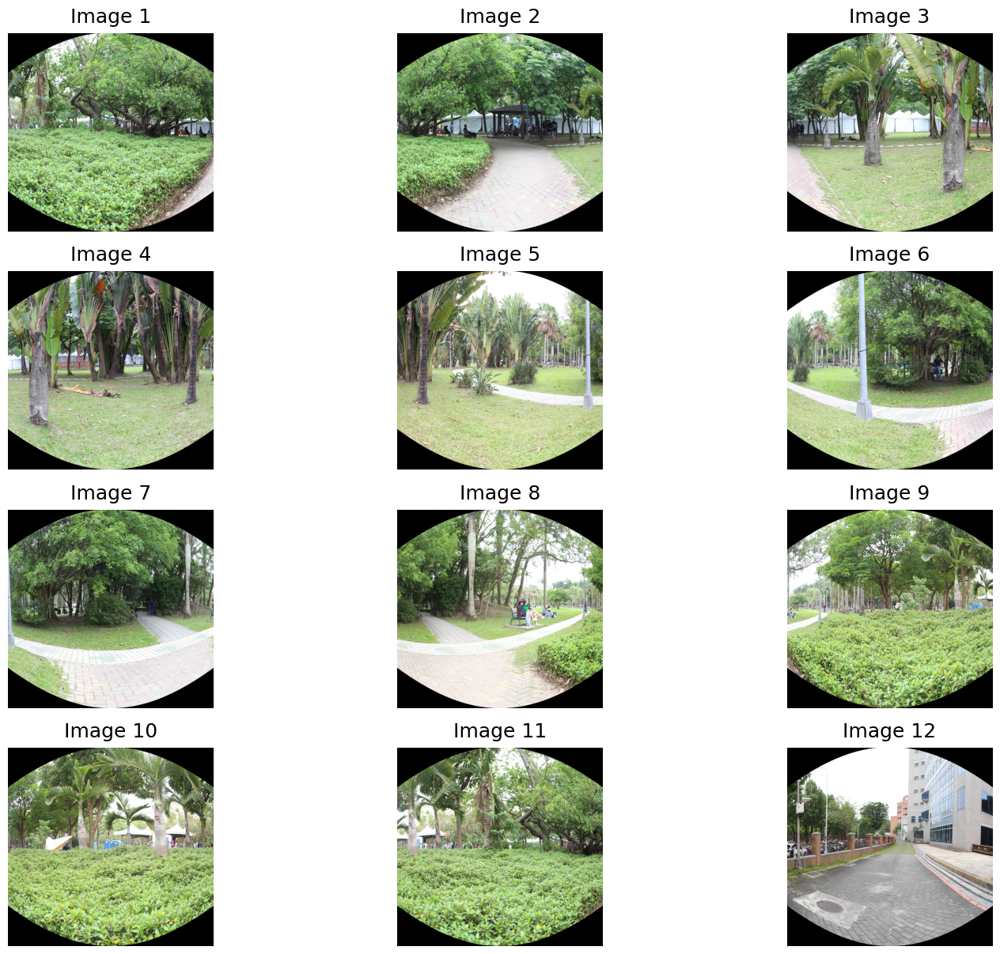

In [24]:
images, masks, border_list = cylindrical_projection_new(images , args.focal_length*args.scale)

fig , axes = plt.subplots(int(np.ceil(len(images) / 3)) , 3, figsize = (18 , 15))
for i , image in enumerate(images):
    ax = axes[i // 3 , i % 3]
    ax.set_title(f'Image {i + 1}' , fontsize = 18 , y = 1.02)
    ax.imshow(cv2.cvtColor(image , cv2.COLOR_BGR2RGB))
    ax.set_axis_off()
plt.show()

In [25]:
a = np.zeros((4,5))
# for i, j in zip([0,1,2,1,0], range(a.shape[1])):
#     a[:i, j]=1
i = np.array([0, 1, 2, 1, 0]) + 1
j = np.arange(a.shape[0])
mask = i > j.reshape(-1, 1)
a[mask] = 1
a

array([[1., 1., 1., 1., 1.],
       [0., 1., 1., 1., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [26]:
a = np.zeros((4,5))
i = a.shape[0] - np.array([0, 1, 2, 1, 0]) -1
j = np.arange(a.shape[0])
mask = i > j.reshape(-1, 1)
a[~mask] = 1
a

array([[0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 1., 1., 1., 0.],
       [1., 1., 1., 1., 1.]])

## Harris Corner Detection

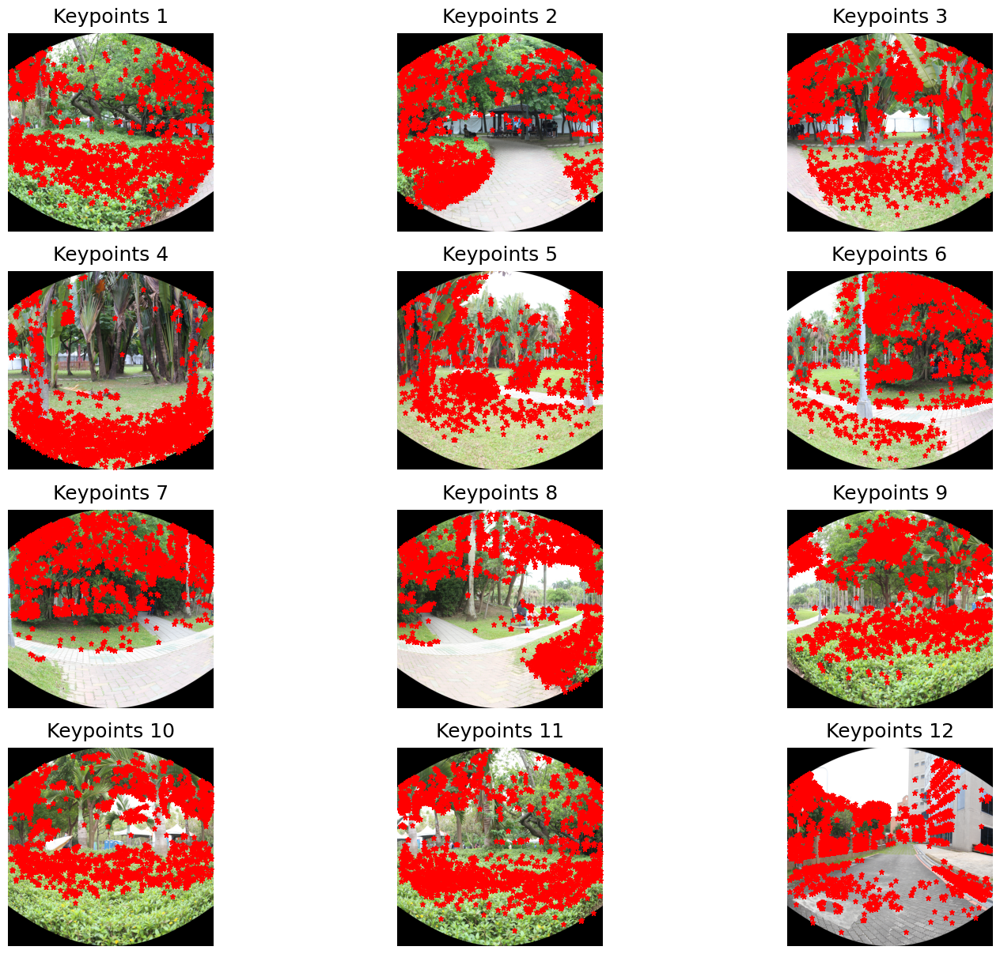

In [27]:
def harris_corner_detector(img, k=0.05):
    img = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    
    # denoise
    blur_img = cv2.GaussianBlur(img, (3,3), 0)
    
    # derivatives
    # dy, dx = np.gradient(gray)
    Ix = cv2.Sobel(blur_img, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(blur_img, cv2.CV_64F, 0, 1, ksize=3)
    
    # compute components of the Harris matrix
    Ixx = Ix*Ix
    Ixy = Ix*Iy
    Iyy = Iy*Iy
    
    # sum with gaussian window
    Sxx = cv2.GaussianBlur(Ixx, (3,3), 0)
    Sxy = cv2.GaussianBlur(Ixy, (3,3), 0)
    Syy = cv2.GaussianBlur(Iyy, (3,3), 0)
    
    # compute R 
    det = Sxx*Syy - Sxy*Sxy
    trace = Sxx + Syy
    R = det - k*(trace**2)
    
    return R, Ix, Iy, Ixx, Iyy

def non_maximum_suppression(R, windows, border):
    scale = args.R_window_scale
    i = border + windows*scale
    j = np.arange(R.shape[0])
    mask1 = i > j.reshape(-1, 1)
    # plt.figure(figsize = (18 , 6))
    # plt.title(f'mask1' , fontsize = 24 , y = 1.02)
    # plt.imshow(mask1)
    # plt.axis('off')
    # plt.show()
    
    i = R.shape[0] - border - windows*scale
    j = np.arange(R.shape[0])
    mask2 = i > j.reshape(-1, 1)
    
    mask = mask1 | ~mask2
    mask[:, -windows*scale:] = True
    mask[:, :windows*scale] = True
    # plt.figure(figsize = (18 , 6))
    # plt.title(f'mask' , fontsize = 24 , y = 1.02)
    # plt.imshow(mask)
    # plt.axis('off')
    # plt.show()
    R[mask] = 0

    # non-maximum suppression in winxwin regions
    local_maximum = maximum_filter(R, (windows, windows))
    R[R!=local_maximum] = 0
    
    return R

def get_top_N_keypoints(R, N):
    # https://stackoverflow.com/questions/29800393/how-to-get-the-index-of-the-largest-n-values-in-a-multi-dimensional-numpy-array

    # Convert it into a 1D array
    R_1d = R.flatten()

    # Find the indices in the 1D array
    idx_1d = R_1d.argsort()[-N:]

    # convert the idx_1d back into indices arrays for each dimension
    r_idx, c_idx = np.unravel_index(idx_1d, R.shape)

    # concatenate positions and values
    keypoints = np.vstack((c_idx, r_idx)).T
    return keypoints
    
def get_orientations(Ix, Iy, bins=8):
    # 計算每個點的強度
    magnitude = np.sqrt(Ix**2 + Iy**2)
    # 計算每個點的角度
    theta = np.arctan(Iy / (Ix + 1e-8)) * (180 / np.pi)
    theta[Ix < 0] += 180
    theta = (theta + 360) % 360
    # 分成 8 bins
    bin_size = 360. / bins
    bucket = np.round(theta/bin_size)
    # Create array of orientation histograms
    histogram = np.zeros((bins,) + magnitude.shape)  # (bins, h, w)
    
    for b in range(bins):
        histogram[b][bucket==b] = 1
        histogram[b] *= magnitude
    
    return histogram, theta

def get_descriptors_sift(keypoints, histogram, theta):
    all_x, all_y = keypoints.T
    descriptors = []
    for y, x in zip(all_y, all_x):
        vector = get_vector(y, x, histogram, theta)
        descriptors.append(vector)
    
    return np.array(descriptors)

def get_vector(y, x, histogram, theta):
    # +angle in cv2 is counter-clockwise.
    # +y is down in image coordinates.
    # 擷取以[x, y]為中心16X16的patch，且根據此點的theta，已中心(8, 8)做旋轉
    M = cv2.getRotationMatrix2D((8, 8), theta[y, x], 1) 
    if y-12 < 0 or x-12 < 0: return 0
    ori_rotated = [cv2.warpAffine(t[y-8:y+8, x-8:x+8], M, (16, 16)) for t in histogram]
    
    vector = []
    subpatch_offsets = [0, 4, 8, 12]
    # 計算每個patch的投票數
    for y in subpatch_offsets: # 4
        for x in subpatch_offsets: # 4
            vector += get_sub_vector(y, x, ori_rotated) # 8
    # 8 orientations x 4x4 histogram array = 128 dimensions
    return vector

def get_sub_vector(y, x, ori):
    # 4X4的patch算8個方向的投票總數
    bin_vote = []
    for b in range(len(ori)):
        bin_vote.append(np.sum(ori[b][y:y+4, x:x+4])) 
        
    # Normalized
    bin_vote_n1 = [x / (np.sum(bin_vote) + 1e-8) for x in bin_vote]
    # clip values larger than 0.2
    bin_vote_clip = [x if x < 0.2 else 0.2 for x in bin_vote_n1]
    # renormalize
    bin_vote_n2 = [x / (np.sum(bin_vote_clip) + 1e-8) for x in bin_vote_clip]
    
    return bin_vote_n2 # 8

def get_descriptors_simple(img, keypoints, windows=9): #return pixel value
    img = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    
    windows//=2
    descriptors = []
    for keypoint in keypoints: 
        x, y = int(keypoint[0]), int(keypoint[1]) #x水平方向 y垂直方向
        patch = img[y-windows:y+windows+1, x-windows:x+windows+1]
        patch = (patch - patch.mean()) / patch.std() # 重要!
        descriptors.append(patch.flatten())
        
    return np.array(descriptors)


keypoints_list = []
descriptors_list = []
for img, border in zip(images, border_list):
    R, Ix, Iy, Ixx, Iyy = harris_corner_detector(img)
    R = non_maximum_suppression(R, args.window, border)
    keypoints = get_top_N_keypoints(R, args.N)
    
    if args.descriptors_sift:
        histogram, theta = get_orientations(Ix, Iy, bins=8)
        descriptors = get_descriptors_sift(keypoints, histogram, theta)
    else:
        descriptors = get_descriptors_simple(img, keypoints, windows=args.window//2)
    
    keypoints_list.append(keypoints)
    descriptors_list.append(descriptors)
    
fig , axes = plt.subplots(int(np.ceil(len(images) / 3)) , 3, figsize = (18 , 15))
for i , image in enumerate(images):
    ax = axes[i // 3 , i % 3]
    ax.set_title(f'Keypoints {i + 1}' , fontsize = 18 , y = 1.02)
    ax.imshow(cv2.cvtColor(image , cv2.COLOR_BGR2RGB))
    ax.plot(keypoints_list[i][ :, 0], keypoints_list[i][ :, 1], 'r*', markersize=5)
    ax.set_axis_off()
plt.show()

In [28]:
def match(d1, d2, ratio=0.7):
    n = len(d1)
    
    # print(d1.shape, d2.shape)
    # 計算兩兩vector的距離，dists[0,1]代表d1[0]與d2[1]的距離
    dists = scipy.spatial.distance.cdist(d1, d2)
    # print ('dists', dists)
    
    # 對每個row由小到大做排序
    sort_idx = np.argsort(dists, 1)
    
    # 取第0個，代表取與每個d1距離最小的d2 idx
    best_idx = sort_idx[:, 0]
    
    # 取與每個d1距離最小的d2的dist
    best_dists = dists[range(n), best_idx]

    # 取距離第2小的dist
    second_best_idx = sort_idx[:, 1]
    second_best_dists = dists[range(n), second_best_idx]

    # 確認最小的dist足夠具有辨識度(best_dists/second_best_dists.mean() < 0.5)
    is_match = best_dists/second_best_dists.mean() < ratio

    # 找出具有辨識度的desc idx (best_dist/second_best_dist < 0.5)
    desc_idx1 = np.where(is_match)[0]
    desc_idx2 = best_idx[desc_idx1]
    # print(desc_idx1.shape, desc_idx2.shape)
    
    # 將match到的idx存入match
    matches = np.array([desc_idx1, desc_idx2]).T
    match_count = len(matches)
    print("match_count: ", match_count)
    return matches.astype(int), match_count



### Homography 與 RANSAC

match_count:  8
match_count:  2
match_count:  2
match_count:  4
match_count:  1
match_count:  0
match_count:  3
match_count:  2
match_count:  6
match_count:  33
match_count:  0
match_count:  8
match_count:  8
match_count:  2
match_count:  1
match_count:  0
match_count:  2
match_count:  0
match_count:  4
match_count:  0
match_count:  4
match_count:  1
match_count:  2
match_count:  8
match_count:  7
match_count:  1
match_count:  1
match_count:  0
match_count:  0
match_count:  0
match_count:  1
match_count:  1
match_count:  1
match_count:  0
match_count:  1
match_count:  4
match_count:  3
match_count:  0
match_count:  0
match_count:  0
match_count:  0
match_count:  0
match_count:  0
match_count:  0
match_count:  2
match_count:  1
match_count:  1
match_count:  4
match_count:  2
match_count:  0
match_count:  0
match_count:  1
match_count:  0
match_count:  4
match_count:  0
match_count:  1
match_count:  0
match_count:  0
match_count:  1
match_count:  2
match_count:  0
match_count:  2
match_c

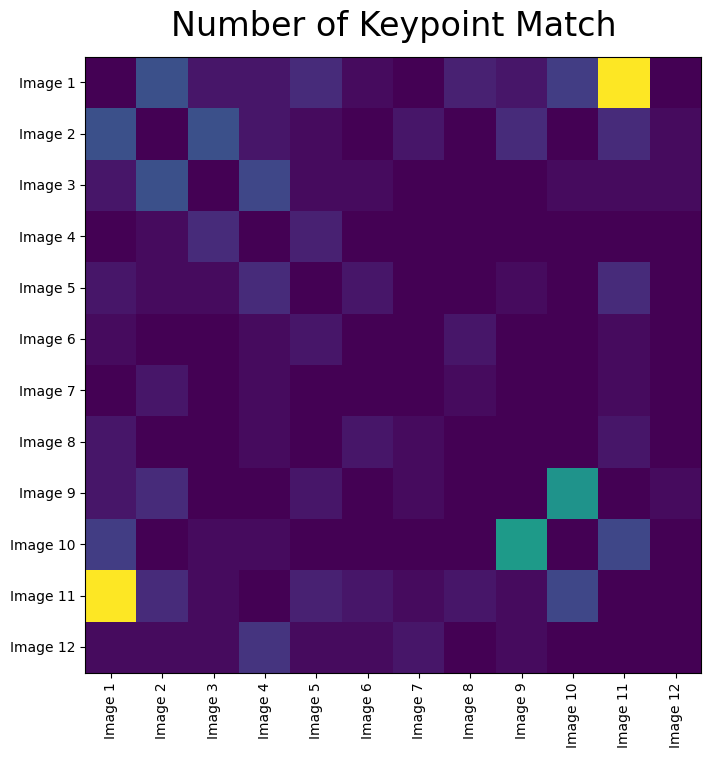

In [29]:
def keypoint_matching(images , descriptors_list):
    all_matches_list = []
    match_count = np.zeros((len(images) , len(images)))
    for i in range(len(descriptors_list)):
        for j in range(len(descriptors_list)):
            m = []
            if i != j:
                m, m_count = match(descriptors_list[i].astype(np.float32) , descriptors_list[j].astype(np.float32))
                match_count[i][j] = m_count
                # if(m_count>30): print(m)
            all_matches_list.append(m)
    return all_matches_list , match_count

all_matches_list , match_count = keypoint_matching(images , descriptors_list)

plt.figure(figsize = (8 , 8))
plt.title('Number of Keypoint Match' , fontsize = 24 , y = 1.02)
plt.imshow(match_count)
plt.xticks(np.arange(len(images)) , [f'Image {i + 1}' for i in range(len(images))] , rotation = 90)
plt.yticks(np.arange(len(images)) , [f'Image {i + 1}' for i in range(len(images))] , rotation = 0)
plt.show()

In [30]:
# for i, mask in enumerate(masks):
#     plt.figure(figsize = (18 , 6))
#     plt.title(f'mask{i}' , fontsize = 24 , y = 1.02)
#     plt.imshow(mask)
#     plt.axis('off')
#     plt.show()

Stitch Image 3 with Image 2
4 8


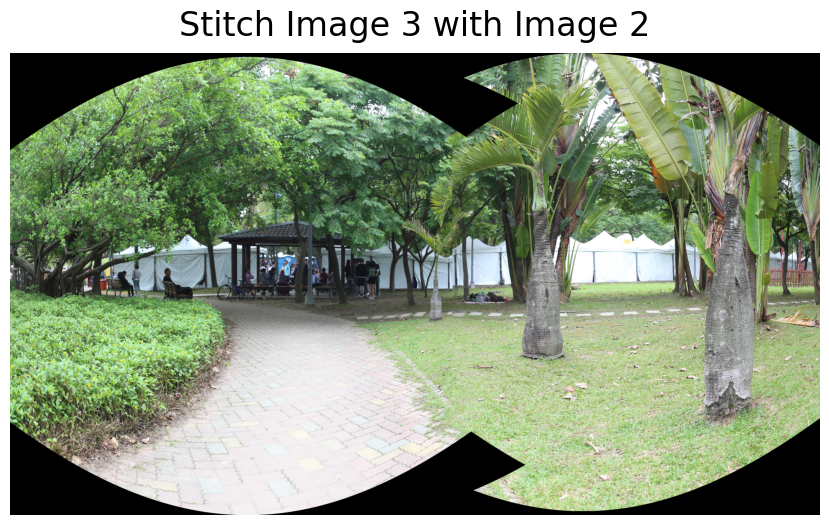

Stitch Image 1 with Image 2
3 8


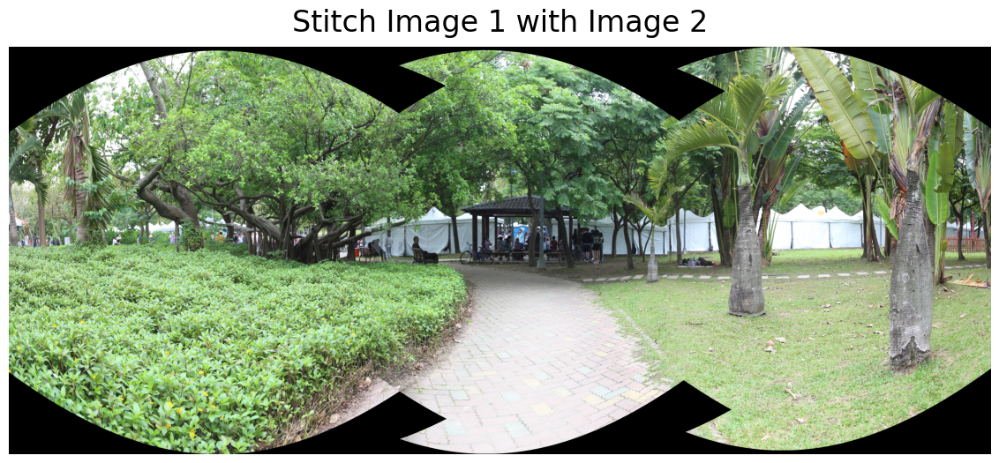

Stitch Image 4 with Image 3
5 7


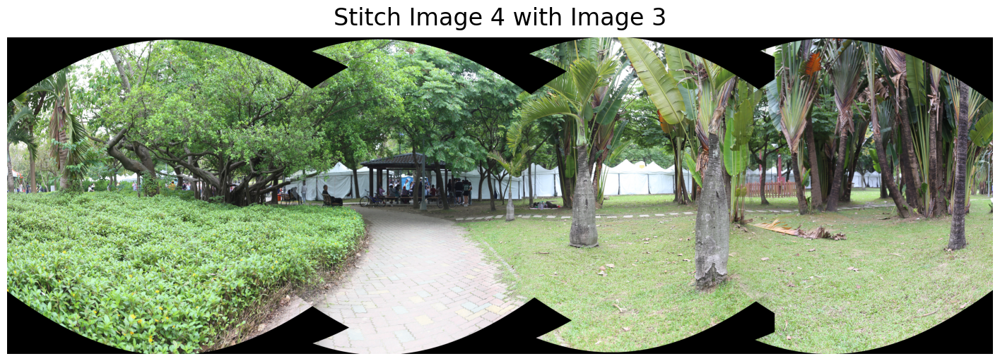

Stitch Image 11 with Image 1
12 33


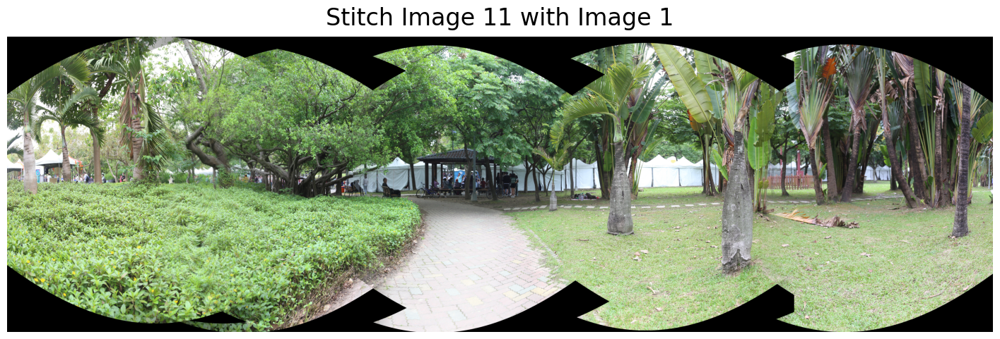

Stitch Image 5 with Image 4
2 3


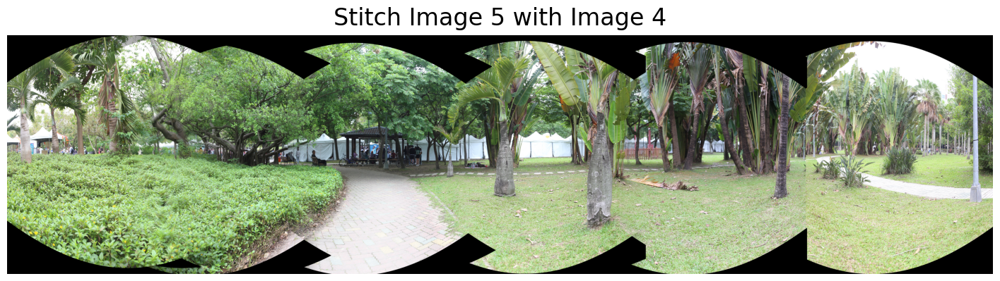

Stitch Image 10 with Image 11
4 7


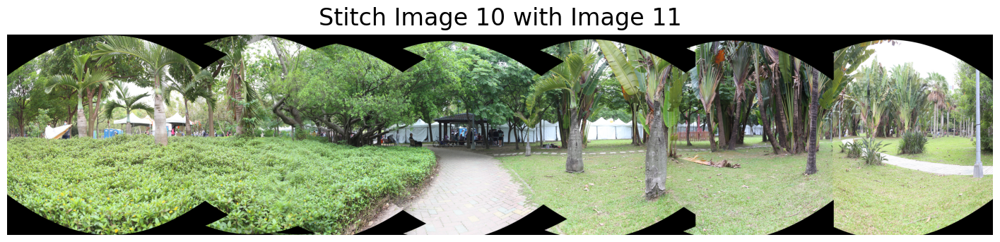

Stitch Image 9 with Image 10
11 18


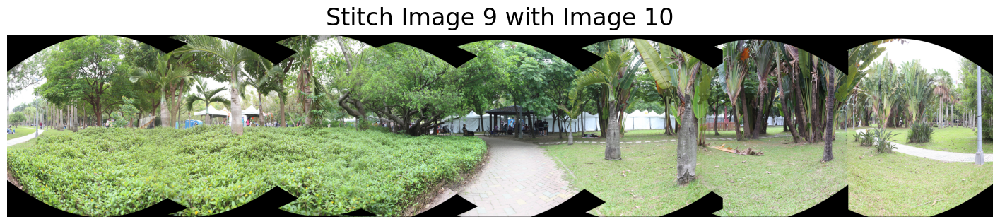

In [37]:
def RANSAC(keypoints1 , keypoints2 , all_matches , iteration = 1000 , threshold = 400):
    max_number_of_inlier , best_offset_x , best_offset_y = -np.inf , None , None
    all_keypoints1 = keypoints1[all_matches[:, 0]]
    all_keypoints2 = keypoints2[all_matches[:, 1]]
    for _ in range(iteration):
        # 隨機取得一對點
        pair = random.choice(all_matches)
        # 用此對點計算offset
        offset_x = keypoints1[pair[0]][0] - keypoints2[pair[1]][0]
        offset_y = keypoints1[pair[0]][1] - keypoints2[pair[1]][1]
        # 計算inlier的個數
        error = (all_keypoints1[:, 0] - (all_keypoints2[:, 0] + offset_x))**2 + (all_keypoints1[:, 1] - (all_keypoints2[:, 1] + offset_y))**2
        number_of_inlier = error[error<threshold].sum()
        # 如果更好就更新
        if number_of_inlier > max_number_of_inlier:
            max_number_of_inlier = number_of_inlier
            best_offset_x = offset_x
            best_offset_y = offset_y
    
    # 計算best_count
    error = (all_keypoints1[:, 0] - (all_keypoints2[:, 0] + best_offset_x))**2 + (all_keypoints1[:, 1] - (all_keypoints2[:, 1] + best_offset_y))**2
    best_count = (error<threshold).sum()
    return int(np.round(best_offset_x)) , int(np.round(best_offset_y)) , best_count


def image_match_verification(all_matches , best_count):
    print(best_count, len(all_matches))
    return len(all_matches)>= 3 and best_count > len(all_matches) * 0.2

def linear_blending(image_1 , image_2 , mask_1 , mask_2 , offset_x , offset_y):
    result_w = image_2.shape[1] + abs(offset_x) if offset_x > 0 else image_1.shape[1] + abs(offset_x)
    result_h = image_2.shape[0] + abs(offset_y) if offset_y > 0 else image_1.shape[0] + abs(offset_y)
    
    translated_M1 = np.array([[1 , 0 , max(0 , -offset_x)] , [0 , 1 , max(0 , -offset_y)]]).astype(np.float32)
    translated_M2 = np.array([[1 , 0 , max(0 , offset_x)] , [0 , 1 , max(0 , offset_y)]]).astype(np.float32)
    
    translated_img1 = cv2.warpAffine(image_1 , translated_M1 , (result_w , result_h))
    translated_img2 = cv2.warpAffine(image_2 , translated_M2 , (result_w , result_h))
    
    translated_mask1 = cv2.warpAffine(mask_1 , translated_M1 , (result_w , result_h)).astype(bool)
    translated_mask2 = cv2.warpAffine(mask_2 , translated_M2 , (result_w , result_h)).astype(bool)
    
    if offset_x > 0:
        weight = np.concatenate([np.ones(abs(offset_x)) , np.linspace(1 , 0 , image_1.shape[1] - abs(offset_x)) , np.zeros(abs(offset_x) + image_2.shape[1] - image_1.shape[1])] , axis = 0)
    else:
        weight = np.concatenate([np.zeros(abs(offset_x)) , np.linspace(0 , 1 , image_2.shape[1] - abs(offset_x)) , np.ones(abs(offset_x) + image_1.shape[1] - image_2.shape[1])] , axis = 0)
    weight = np.repeat(np.expand_dims(np.repeat(np.expand_dims(weight , axis = 0) , result_h , axis = 0) , axis = -1) , 3 , axis = 2)
    result = weight * translated_img1 + (1 - weight) * translated_img2

    result[translated_mask1 & ~translated_mask2] = translated_img1[translated_mask1 & ~translated_mask2]
    result[translated_mask2 & ~translated_mask1] = translated_img2[translated_mask2 & ~translated_mask1]
    result_mask = translated_mask2 | translated_mask1

    return result.astype(np.uint8) , result_mask.astype(np.uint8)

def stitch_images(images , masks , keypoints_list , all_matches_list , match_count , potential_image_match = 6 , start_index = 0):
    next_image_index = [start_index]
    used = [False]*len(images)
    used[start_index] = True
    total_offset_x = np.zeros(len(images)).astype(int)
    total_offset_y = np.zeros(len(images)).astype(int)
    result = images[start_index].copy()
    result_mask = masks[start_index].copy()
    while next_image_index:
        i = next_image_index[0]
        next_image_index.pop(0)
        for j in np.flip(np.argsort(match_count[i]))[ : potential_image_match]:
            if used[j]:
                continue
            all_matches = all_matches_list[i * len(images) + j]
            if(len(all_matches)==0): continue
            print(f'Stitch Image {j + 1} with Image {i + 1}')
            offset_x , offset_y , best_count = RANSAC(keypoints_list[i] , keypoints_list[j] , all_matches)
            if image_match_verification(all_matches , best_count):
                offset_x += total_offset_x[i]
                offset_y += total_offset_y[i]
                result , result_mask = linear_blending(result , images[j] , result_mask , masks[j] , offset_x , offset_y)
                for k in range(len(images)):
                    if used[k]:
                        total_offset_x[k] += max(0 , -offset_x)
                        total_offset_y[k] += max(0 , -offset_y)
                total_offset_x[j] = max(0 , offset_x)
                total_offset_y[j] = max(0 , offset_y)
                used[j] = 1
                next_image_index.append(j)
                plt.figure(figsize = (18 , 6))
                plt.title(f'Stitch Image {j + 1} with Image {i + 1}' , fontsize = 24 , y = 1.02)
                plt.imshow(cv2.cvtColor(result , cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.show()
                
    return result

result = stitch_images(images , masks , keypoints_list , all_matches_list , match_count , potential_image_match = 2 , start_index = 1)

# end_to_end_alignment

In [38]:
def find_boundary(img):
    h, w, _ = img.shape
    cols = np.any(img, axis=0)
    rows = np.any(img, axis=1)
    left = np.argmax(cols)
    right = w - np.argmax(cols[::-1]) - 1
    up = np.argmax(rows)
    down = h - np.argmax(rows[::-1]) - 1
    return (left, right, up, down)

def end_to_end_alignment_final(img):
    left_black_points = np.nonzero(img[:, 0])[0]
    first_black_point = left_black_points[0] if len(left_black_points) > 0 else None

    right_black_points = np.nonzero(img[:, -1])[0]
    second_black_point = right_black_points[0] if len(right_black_points) > 0 else None

    global_offset = second_black_point - first_black_point
    offset = global_offset / img.shape[1]
    print(f"offset = {offset}")

    img_final = np.zeros(img.shape, np.uint8)

    if offset >= 0:
        for i in range(img.shape[1]):
            img_final[:img.shape[0] - int(i*offset), i] = img[int(i*offset):, i]
    else:
        offset = abs(offset)
        for i in range(img.shape[1]-1, -1, -1):
            p = int( (img.shape[1]-1-i)*offset)
            img_final[:img.shape[0] - p, i] = img[p:, i]

    left, right, up, down = find_boundary(img_final)
    img_final = img_final[up:down, left:right]

    return img_final

offset = 0.0037897928246589186


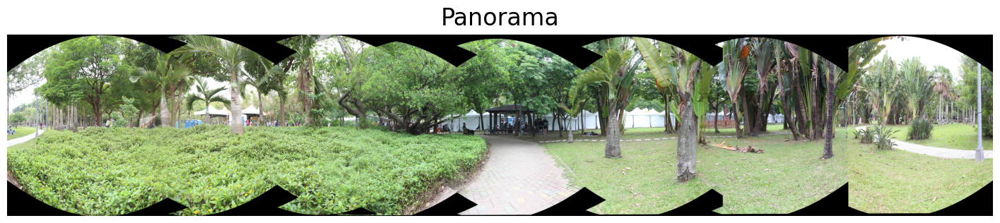

In [39]:
result_image = end_to_end_alignment_final(result)
plt.figure(figsize = (18 , 6))
plt.title('Panorama' , fontsize = 24 , y = 1.02)
plt.imshow(cv2.cvtColor(result_image , cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [40]:
def global_alignment(image , border = 5):
    height , width , _ = image.shape
    x1 , y1 = 0 , np.where(np.sum(image , axis = 2)[ : , 0] != 0)[0][0]
    x2 , y2 = 0 , np.where(np.sum(image , axis = 2)[ : , 0] != 0)[0][-1]
    x3 , y3 = width - 1 , np.where(np.sum(image , axis = 2)[ : , -1] != 0)[0][-1]
    x4 , y4 = width - 1 , np.where(np.sum(image , axis = 2)[ : , -1] != 0)[0][0]
    new_height = min(abs(y1 - y2) , abs(y3 - y4))
    new_width = min(abs(x1 - x4) , abs(x2 - x3))
    source_points = np.array([[x1 , y1] , [x2 , y2] , [x3 , y3] , [x4 , y4]]).astype(np.float32)
    destination_points = np.array([[0 , 0] , [0 , new_height - 1] , [new_width - 1 , new_height - 1] , [new_width - 1 , 0]]).astype(np.float32)
    transform_matrix = cv2.getPerspectiveTransform(source_points , destination_points)
    return cv2.warpPerspective(image , transform_matrix , (new_width , new_height))[border : -border , border : -border , : ]

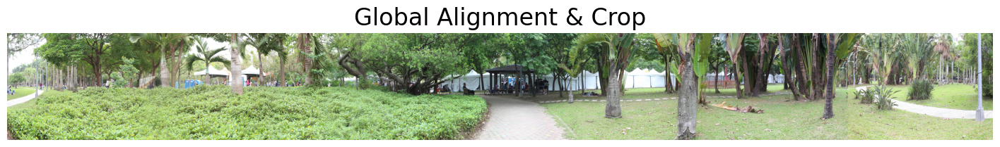

In [41]:
result = global_alignment(result)
plt.figure(figsize = (18 , 6))
plt.title('Global Alignment & Crop' , fontsize = 24 , y = 1.02)
plt.imshow(cv2.cvtColor(result , cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [42]:
cv2.imwrite(args.output_image, result)

True